In [15]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import numpy as np
import sklearn
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.model_selection import cross_val_score
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score
import tensorflow as tf
from tensorflow import keras
from prettytable import PrettyTable

<html> <body> <h2>Traffic Accident Dataset Description</h2> <p>This dataset contains information about traffic accidents, including details about the accidents, vehicles, and casualties involved. Each row in the dataset represents a single casualty, and there may be multiple casualties associated with a single accident.</p> <table border="1"> <tr> <th>Column Name</th> <th>Description</th> </tr> <tr> <td>status</td> <td>The validation status of the record (all records in this dataset are currently labeled as "Unvalidated").</td> </tr> <tr> <td>accident_index</td> <td>A unique identifier for each accident.</td> </tr> <tr> <td>accident_year</td> <td>The year in which the accident occurred.</td> </tr> <tr> <td>accident_reference</td> <td>Another identifier for each accident.</td> </tr> <tr> <td>vehicle_reference</td> <td>A unique reference number for each vehicle involved in the accident.</td> </tr> <tr> <td>casualty_reference</td> <td>The number of the casualty within the accident.</td> </tr> <tr> <td>casualty_class</td> <td>The type of casualty (e.g. driver, passenger, pedestrian).</td> </tr> <tr> <td>sex_of_casualty</td> <td>The gender of the casualty.</td> </tr> <tr> <td>age_of_casualty</td> <td>The age of the casualty at the time of the accident.</td> </tr> <tr> <td>age_band_of_casualty</td> <td>The age band of the casualty (e.g. 0-15, 16-24, etc.).</td> </tr> <tr> <td>casualty_severity</td> <td>The severity of the casualty's injuries (e.g. fatal, serious, slight).</td> </tr> <tr> <td>pedestrian_location</td> <td>The location of the casualty if they were a pedestrian (e.g. carriageway, footpath, etc.).</td> </tr> <tr> <td>pedestrian_movement</td> <td>The movement of the casualty if they were a pedestrian (e.g. crossing, standing, etc.).</td> </tr> <tr> <td>car_passenger</td> <td>Whether the casualty was a car passenger at the time of the accident.</td> </tr> <tr> <td>bus_or_coach_passenger</td> <td>Whether the casualty was a bus or coach passenger at the time of the accident.</td> </tr> <tr> <td>pedestrian_road_maintenance_worker</td> <td>Whether the casualty was a road maintenance worker at the time of the accident.</td> </tr> <tr> <td>casualty_type</td> <td>The type of casualty (e.g. driver, passenger, pedestrian).</td> </tr> <tr> <td>casualty_home_area_type</td> <td>The type of area where the casualty resides.</td> </tr> <tr> <td>casualty_imd_decile</td> <td>The Index of Multiple Deprivation (IMD) decile for the casualty's area of residence.</td> </tr> <tr> <td>lsoa\_of\_casualty</td> <td>The Lower Layer Super Output Area (LSOA) code for the casualty's area of residence.</td> </tr> </table> </body> </html>
This dataset includes information about accidents that occurred in 2022, with a range of casualty types, ages, and severities. The data may be used for analysis of traffic accidents and development of strategies to prevent them.

### Load and clean the dataset

In [16]:
data = pd.read_csv("dft-road-casualty-statistics-casualty-provisional-mid-year-unvalidated-2022.csv")

In [17]:
data.head()

,status,accident_index,accident_year,accident_reference,vehicle_reference,casualty_reference,casualty_class,sex_of_casualty,age_of_casualty,age_band_of_casualty,casualty_severity,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker,casualty_type,casualty_home_area_type,casualty_imd_decile,lsoa_of_casualty
0,Unvalidated,2022070151244,2022,070151244,2,1,1,2,46,8,3,0,0,0,0,0,9,1,9,E01033378
1,Unvalidated,2022070152668,2022,070152668,1,1,1,1,30,6,3,0,0,0,0,0,9,1,2,E01018551
2,Unvalidated,2022070154696,2022,070154696,1,1,1,2,58,9,3,0,0,0,0,0,9,1,10,E01006134
3,Unvalidated,2022070154696,2022,070154696,2,3,1,2,78,11,3,0,0,0,0,0,9,2,10,E01018724
4,Unvalidated,2022070154696,2022,070154696,3,2,1,1,63,9,3,0,0,0,0,0,9,3,7,W01000578


In [18]:
# print out the unique value of each column
for column in data.columns:
    unique_values = data[column].unique()

    if len(unique_values) < 50:
        print(f"Unique values of {column}")

        for unique_value in unique_values:
            print(f"\t'{unique_value}' repeated {len(data.loc[data[column] == unique_value])}")

        print("\n")

Unique values of status
	'Unvalidated' repeated 61352


Unique values of accident_year
	'2022' repeated 61352


Unique values of vehicle_reference
	'2' repeated 23337
	'1' repeated 36255
	'3' repeated 1427
	'4' repeated 227
	'5' repeated 71
	'8' repeated 4
	'6' repeated 19
	'9' repeated 3
	'227' repeated 1
	'7' repeated 7
	'61' repeated 1


Unique values of casualty_reference
	'1' repeated 47792
	'3' repeated 2795
	'2' repeated 9305
	'4' repeated 934
	'5' repeated 325
	'6' repeated 100
	'7' repeated 37
	'8' repeated 15
	'9' repeated 11
	'10' repeated 10
	'11' repeated 7
	'12' repeated 6
	'14' repeated 4
	'15' repeated 3
	'13' repeated 4
	'16' repeated 2
	'22' repeated 1
	'148' repeated 1


Unique values of casualty_class
	'1' repeated 40702
	'2' repeated 11710
	'3' repeated 8940


Unique values of sex_of_casualty
	'2' repeated 23442
	'1' repeated 37452
	'-1' repeated 448
	'9' repeated 10


Unique values of age_band_of_casualty
	'8' repeated 7842
	'6' repeated 12872
	'9' repeated 5842
	

In [19]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
accident_year,61352.0,2022.000000,0.000000,2022.0,2022.0,2022.0,2022.0,2022.0
vehicle_reference,61352.0,1.450368,1.109855,1.0,1.0,1.0,2.0,227.0
casualty_reference,61352.0,1.333779,0.981507,1.0,1.0,1.0,1.0,148.0
casualty_class,61352.0,1.482299,0.735614,1.0,1.0,1.0,2.0,3.0
sex_of_casualty,61352.0,1.368790,0.534536,-1.0,1.0,1.0,2.0,9.0
age_of_casualty,61352.0,36.670312,19.574357,-1.0,22.0,34.0,50.0,101.0
age_band_of_casualty,61352.0,6.288157,2.463082,-1.0,5.0,6.0,8.0,11.0
casualty_severity,61352.0,2.783039,0.442318,1.0,3.0,3.0,3.0,3.0
pedestrian_location,61352.0,0.800316,2.197167,0.0,0.0,0.0,0.0,10.0
pedestrian_movement,61352.0,0.645325,2.009611,0.0,0.0,0.0,0.0,9.0


In [20]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 61352 entries, 0 to 61351
Data columns (total 20 columns):
 #   Column                              Non-Null Count  Dtype 
---  ------                              --------------  ----- 
 0   status                              61352 non-null  object
 1   accident_index                      61352 non-null  object
 2   accident_year                       61352 non-null  int64 
 3   accident_reference                  61352 non-null  object
 4   vehicle_reference                   61352 non-null  int64 
 5   casualty_reference                  61352 non-null  int64 
 6   casualty_class                      61352 non-null  int64 
 7   sex_of_casualty                     61352 non-null  int64 
 8   age_of_casualty                     61352 non-null  int64 
 9   age_band_of_casualty                61352 non-null  int64 
 10  casualty_severity                   61352 non-null  int64 
 11  pedestrian_location                 61352 non-null  in

In [21]:
# Because the "status" and "accident year" columns has just one value we can just remove them from our dataset
data.drop(columns=["status", "accident_year"], axis=1, inplace=True)

In [22]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
vehicle_reference,61352.0,1.450368,1.109855,1.0,1.0,1.0,2.0,227.0
casualty_reference,61352.0,1.333779,0.981507,1.0,1.0,1.0,1.0,148.0
casualty_class,61352.0,1.482299,0.735614,1.0,1.0,1.0,2.0,3.0
sex_of_casualty,61352.0,1.368790,0.534536,-1.0,1.0,1.0,2.0,9.0
age_of_casualty,61352.0,36.670312,19.574357,-1.0,22.0,34.0,50.0,101.0
age_band_of_casualty,61352.0,6.288157,2.463082,-1.0,5.0,6.0,8.0,11.0
casualty_severity,61352.0,2.783039,0.442318,1.0,3.0,3.0,3.0,3.0
pedestrian_location,61352.0,0.800316,2.197167,0.0,0.0,0.0,0.0,10.0
pedestrian_movement,61352.0,0.645325,2.009611,0.0,0.0,0.0,0.0,9.0
car_passenger,61352.0,0.222047,0.615127,-1.0,0.0,0.0,0.0,9.0


In [23]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 61352 entries, 0 to 61351
Data columns (total 18 columns):
 #   Column                              Non-Null Count  Dtype 
---  ------                              --------------  ----- 
 0   accident_index                      61352 non-null  object
 1   accident_reference                  61352 non-null  object
 2   vehicle_reference                   61352 non-null  int64 
 3   casualty_reference                  61352 non-null  int64 
 4   casualty_class                      61352 non-null  int64 
 5   sex_of_casualty                     61352 non-null  int64 
 6   age_of_casualty                     61352 non-null  int64 
 7   age_band_of_casualty                61352 non-null  int64 
 8   casualty_severity                   61352 non-null  int64 
 9   pedestrian_location                 61352 non-null  int64 
 10  pedestrian_movement                 61352 non-null  int64 
 11  car_passenger                       61352 non-null  in

### Let's do some analysis on dataset

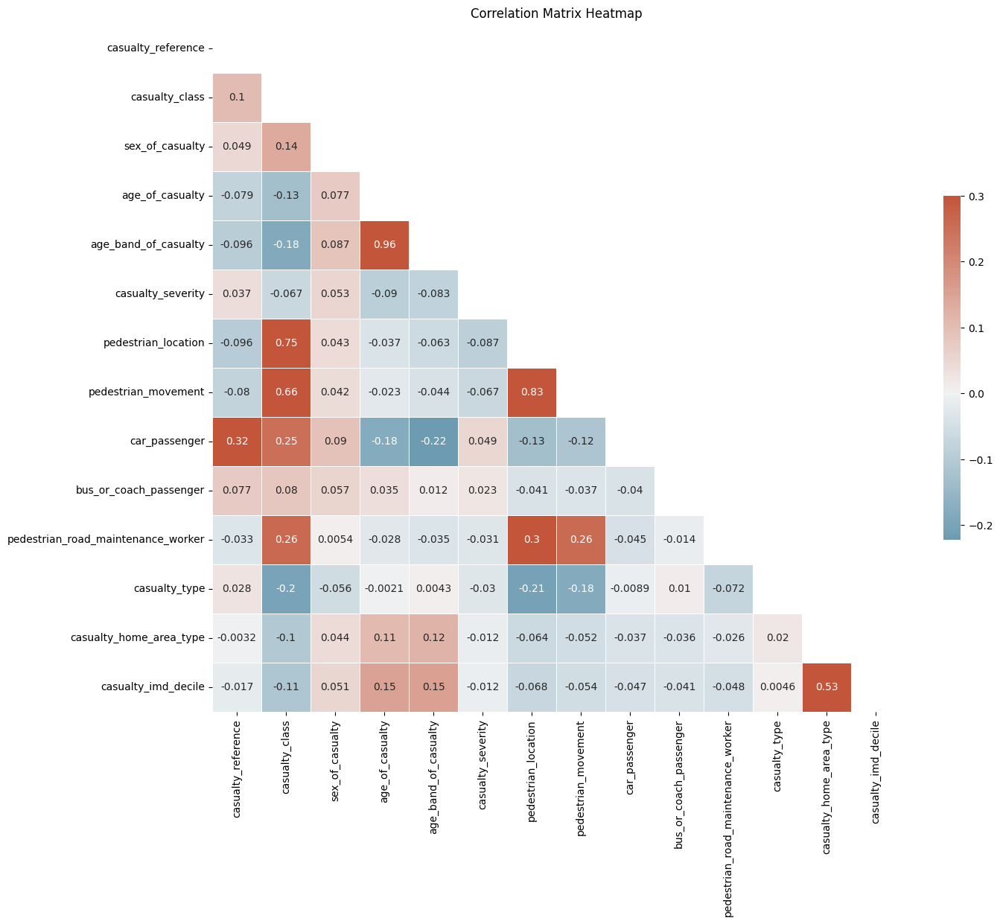

<Figure size 640x480 with 0 Axes>

In [37]:
# Compute the correlation matrix
corr = data.drop(columns=["accident_index", "accident_reference", "vehicle_reference", "lsoa_of_casualty"], axis=1).corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
plt.figure(figsize=(15, 12))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True)

plt.title('Correlation Matrix Heatmap')
plt.show()
plt.savefig("test.png")

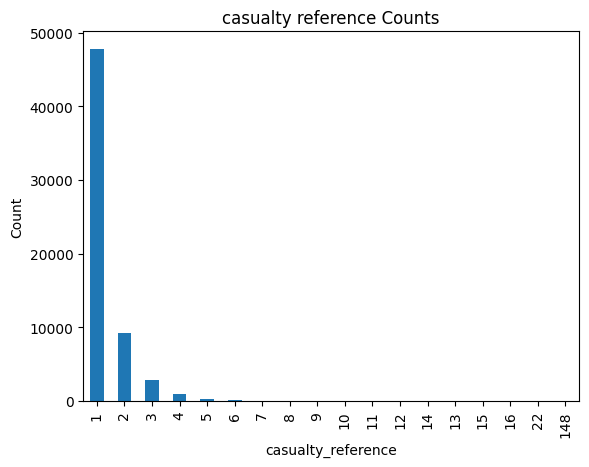

Unique values of casualty_reference


	'1' repeated 47792
	'3' repeated 2795
	'2' repeated 9305
	'4' repeated 934
	'5' repeated 325
	'6' repeated 100
	'7' repeated 37
	'8' repeated 15
	'9' repeated 11
	'10' repeated 10
	'11' repeated 7
	'12' repeated 6
	'14' repeated 4
	'15' repeated 3
	'13' repeated 4
	'16' repeated 2
	'22' repeated 1
	'148' repeated 1




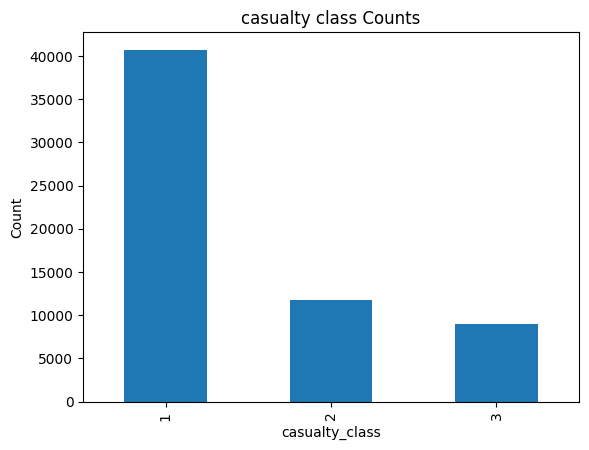

Unique values of casualty_class


	'1' repeated 40702
	'2' repeated 11710
	'3' repeated 8940




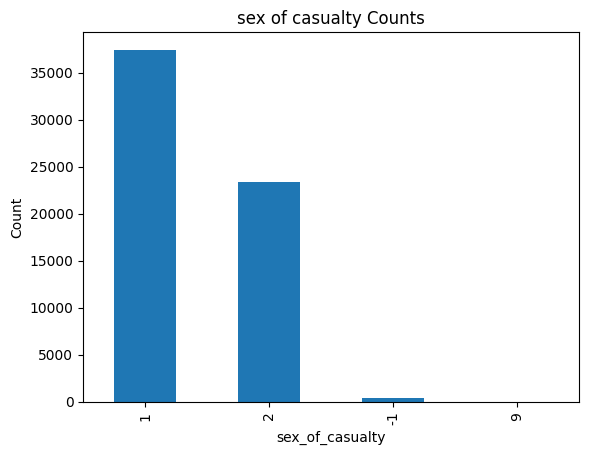

Unique values of sex_of_casualty


	'2' repeated 23442
	'1' repeated 37452
	'-1' repeated 448
	'9' repeated 10




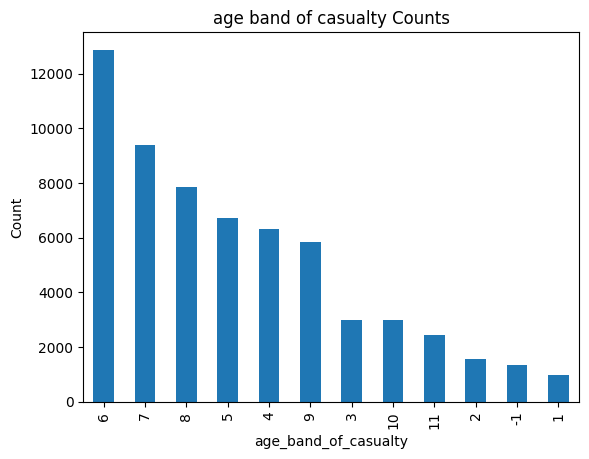

Unique values of age_band_of_casualty


	'8' repeated 7842
	'6' repeated 12872
	'9' repeated 5842
	'11' repeated 2442
	'4' repeated 6328
	'10' repeated 2982
	'3' repeated 2985
	'7' repeated 9407
	'2' repeated 1575
	'5' repeated 6730
	'1' repeated 997
	'-1' repeated 1350




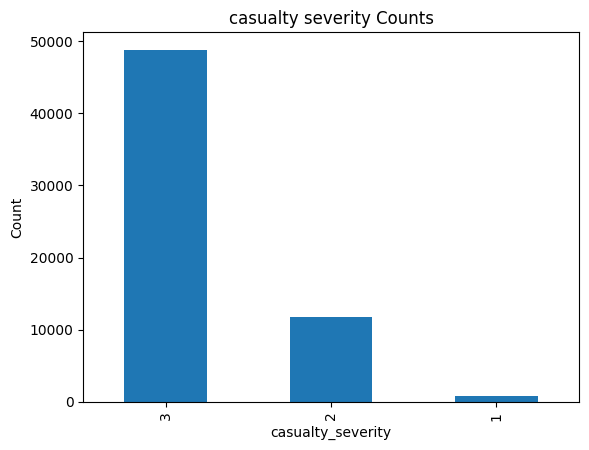

Unique values of casualty_severity


	'3' repeated 48831
	'2' repeated 11731
	'1' repeated 790




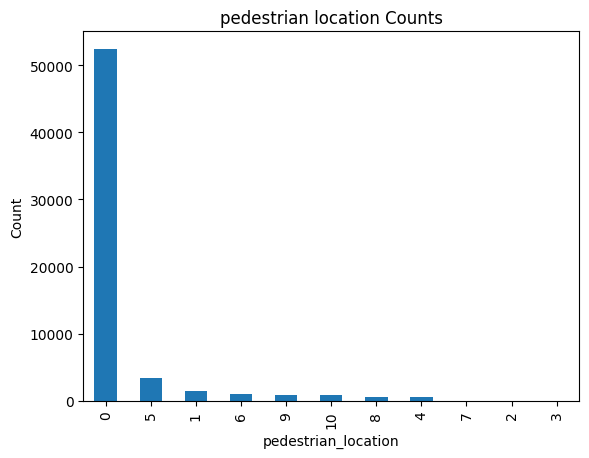

Unique values of pedestrian_location


	'0' repeated 52412
	'5' repeated 3351
	'10' repeated 869
	'9' repeated 953
	'6' repeated 1047
	'8' repeated 565
	'1' repeated 1472
	'4' repeated 546
	'7' repeated 63
	'3' repeated 32
	'2' repeated 42




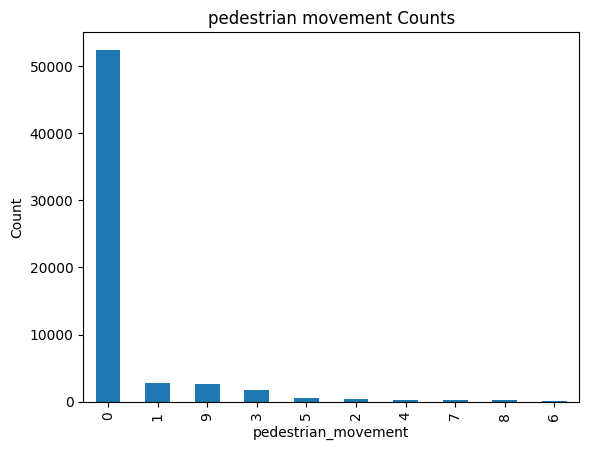

Unique values of pedestrian_movement


	'0' repeated 52411
	'2' repeated 429
	'9' repeated 2567
	'8' repeated 224
	'3' repeated 1784
	'1' repeated 2847
	'7' repeated 226
	'5' repeated 482
	'4' repeated 322
	'6' repeated 60




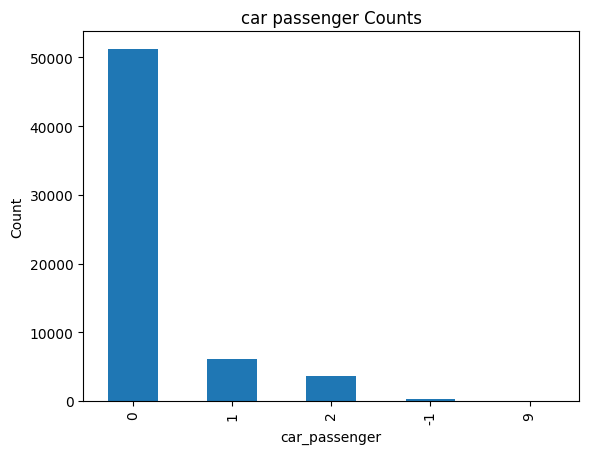

Unique values of car_passenger


	'0' repeated 51219
	'2' repeated 3582
	'1' repeated 6170
	'-1' repeated 314
	'9' repeated 67




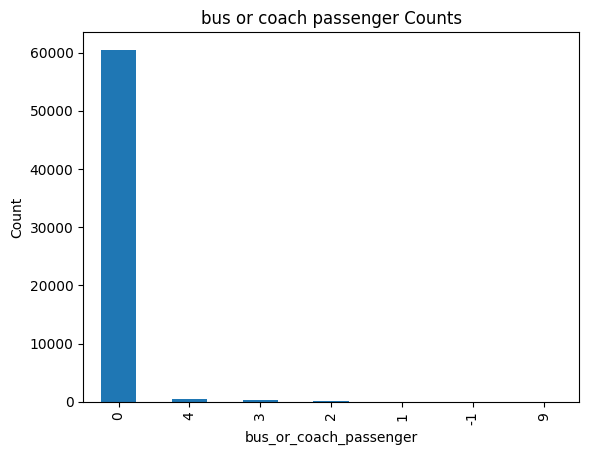

Unique values of bus_or_coach_passenger


	'0' repeated 60471
	'2' repeated 59
	'4' repeated 494
	'1' repeated 32
	'3' repeated 264
	'-1' repeated 23
	'9' repeated 9




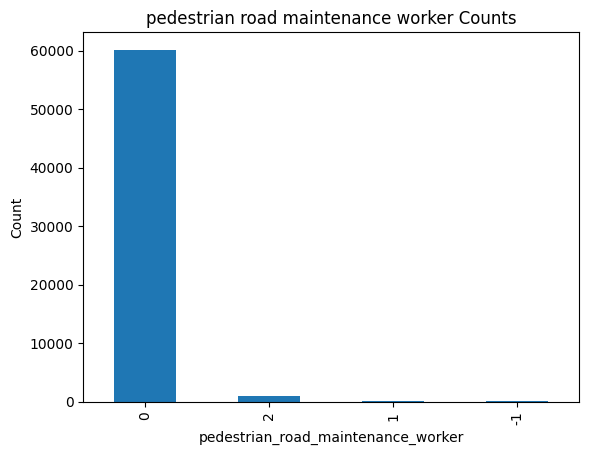

Unique values of pedestrian_road_maintenance_worker


	'0' repeated 60117
	'2' repeated 1007
	'1' repeated 115
	'-1' repeated 113




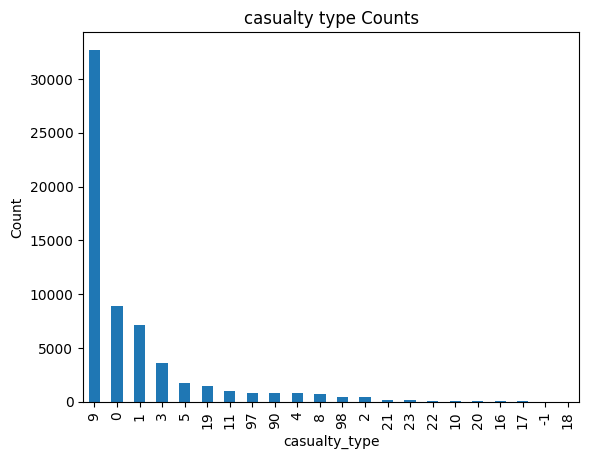

Unique values of casualty_type


	'9' repeated 32715
	'1' repeated 7155
	'0' repeated 8940
	'20' repeated 76
	'2' repeated 410
	'3' repeated 3629
	'17' repeated 31
	'5' repeated 1791
	'4' repeated 822
	'11' repeated 972
	'98' repeated 420
	'97' repeated 861
	'90' repeated 829
	'8' repeated 699
	'19' repeated 1448
	'21' repeated 178
	'23' repeated 127
	'22' repeated 110
	'10' repeated 96
	'16' repeated 34
	'18' repeated 4
	'-1' repeated 5




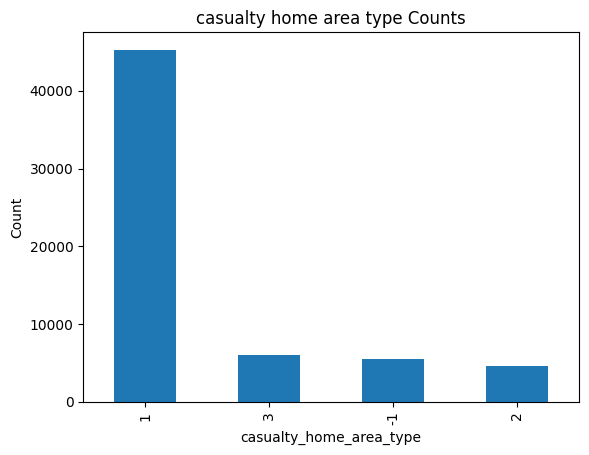

Unique values of casualty_home_area_type


	'1' repeated 45274
	'2' repeated 4579
	'3' repeated 6001
	'-1' repeated 5498




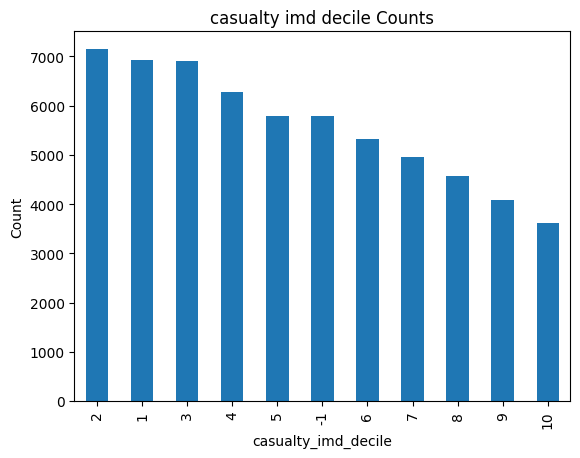

Unique values of casualty_imd_decile


	'9' repeated 4078
	'2' repeated 7152
	'10' repeated 3612
	'7' repeated 4949
	'-1' repeated 5784
	'5' repeated 5791
	'8' repeated 4562
	'3' repeated 6903
	'4' repeated 6268
	'1' repeated 6922
	'6' repeated 5331




In [ ]:
# bar plot of some features of the dataset
columns = ['casualty_reference',
 'casualty_class',
 'sex_of_casualty',
 'age_band_of_casualty',
 'casualty_severity',
 'pedestrian_location',
 'pedestrian_movement',
 'car_passenger',
 'bus_or_coach_passenger',
 'pedestrian_road_maintenance_worker',
 'casualty_type',
 'casualty_home_area_type',
 'casualty_imd_decile']

for column in columns:
    plt.figure()
    data[column].value_counts().plot(kind="bar")
    plt.title(f"{column.replace('_', ' ')} Counts")
    plt.xlabel(f"{column}")
    plt.ylabel("Count")
    plt.show()

    print(f"Unique values of {column}")

    print("\n")
    for unique_value in data[column].unique():
        print(f"\t'{unique_value}' repeated {len(data.loc[data[column] == unique_value])}")
    print("\n")

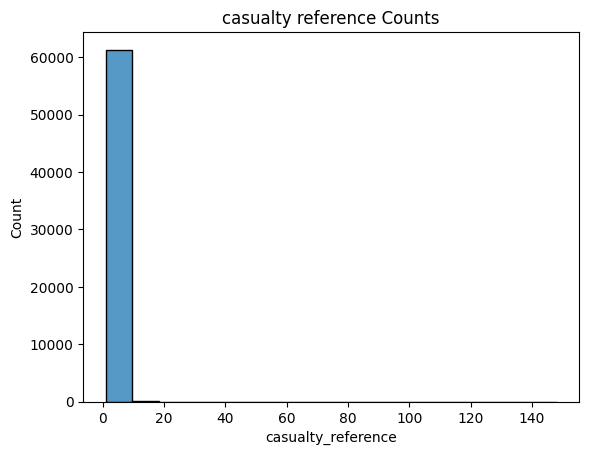

Unique values of casualty_reference


	'1' repeated 47792
	'3' repeated 2795
	'2' repeated 9305
	'4' repeated 934
	'5' repeated 325
	'6' repeated 100
	'7' repeated 37
	'8' repeated 15
	'9' repeated 11
	'10' repeated 10
	'11' repeated 7
	'12' repeated 6
	'14' repeated 4
	'15' repeated 3
	'13' repeated 4
	'16' repeated 2
	'22' repeated 1
	'148' repeated 1




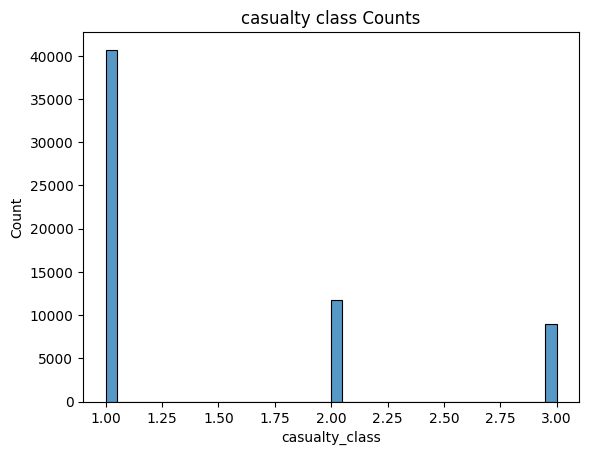

Unique values of casualty_class


	'1' repeated 40702
	'2' repeated 11710
	'3' repeated 8940




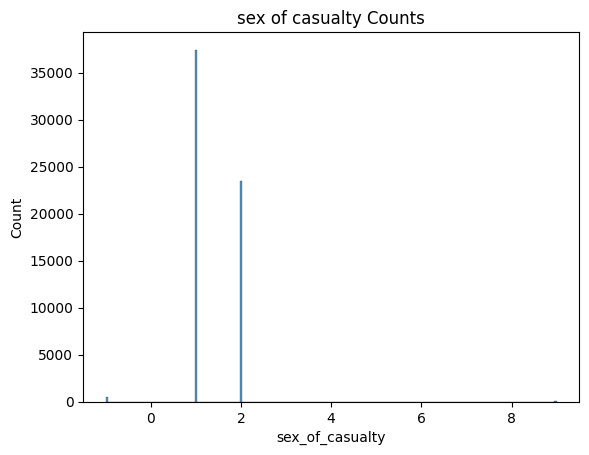

Unique values of sex_of_casualty


	'2' repeated 23442
	'1' repeated 37452
	'-1' repeated 448
	'9' repeated 10




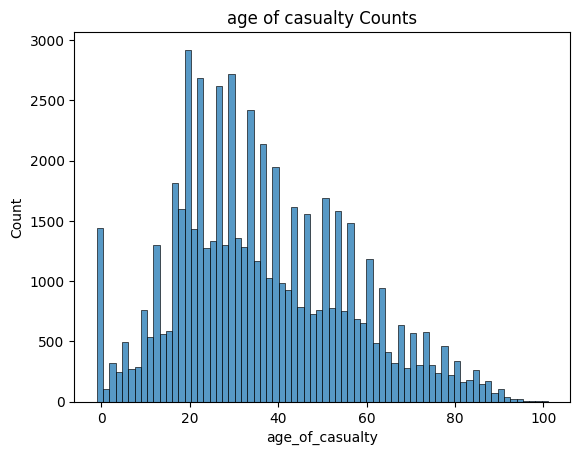

Unique values of age_of_casualty


	'46' repeated 745
	'30' repeated 1366
	'58' repeated 688
	'78' repeated 202
	'63' repeated 474
	'52' repeated 775
	'50' repeated 817
	'16' repeated 677
	'74' repeated 311
	'79' repeated 217
	'13' repeated 606
	'48' repeated 723
	'45' repeated 785
	'28' repeated 1298
	'54' repeated 837
	'42' repeated 926
	'33' repeated 1257
	'34' repeated 1164
	'7' repeated 274
	'20' repeated 1403
	'24' repeated 1274
	'18' repeated 1596
	'80' repeated 186
	'14' repeated 560
	'32' repeated 1282
	'19' repeated 1518
	'59' repeated 648
	'36' repeated 1113
	'84' repeated 150
	'23' repeated 1303
	'43' repeated 866
	'55' repeated 753
	'5' repeated 241
	'31' repeated 1360
	'25' repeated 1335
	'26' repeated 1307
	'21' repeated 1432
	'72' repeated 303
	'15' repeated 583
	'22' repeated 1386
	'47' repeated 811
	'86' repeated 143
	'76' repeated 240
	'61' repeated 567
	'-1' repeated 1350
	'35' repeated 1168
	'51' repeated 874
	'17' repeated 1134
	'68' repeated 304
	'38' repeated 10

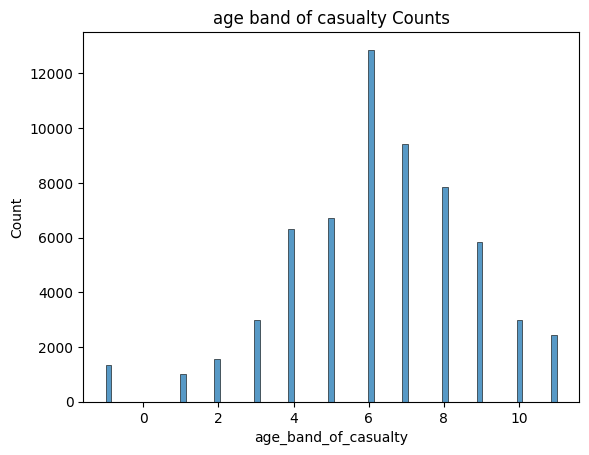

Unique values of age_band_of_casualty


	'8' repeated 7842
	'6' repeated 12872
	'9' repeated 5842
	'11' repeated 2442
	'4' repeated 6328
	'10' repeated 2982
	'3' repeated 2985
	'7' repeated 9407
	'2' repeated 1575
	'5' repeated 6730
	'1' repeated 997
	'-1' repeated 1350




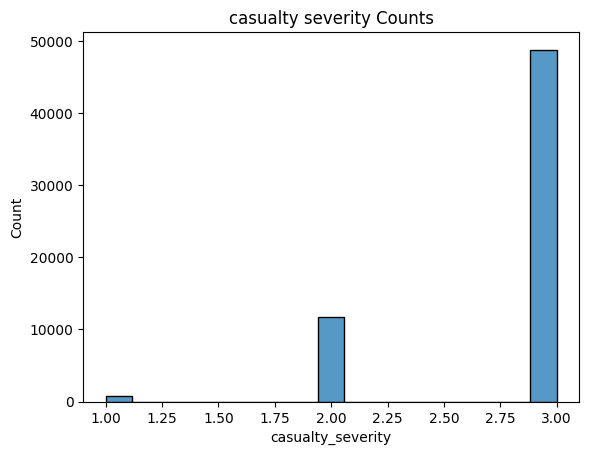

Unique values of casualty_severity


	'3' repeated 48831
	'2' repeated 11731
	'1' repeated 790




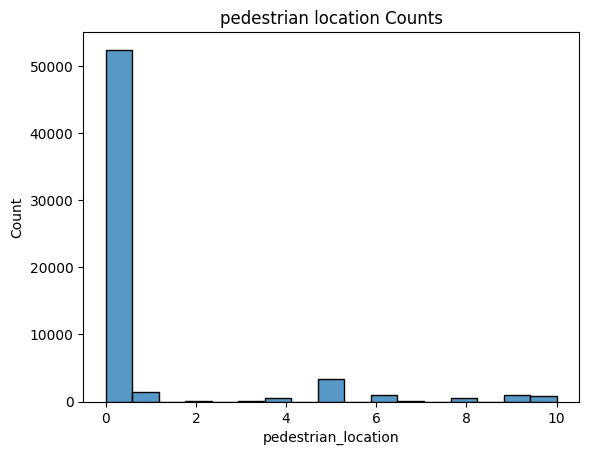

Unique values of pedestrian_location


	'0' repeated 52412
	'5' repeated 3351
	'10' repeated 869
	'9' repeated 953
	'6' repeated 1047
	'8' repeated 565
	'1' repeated 1472
	'4' repeated 546
	'7' repeated 63
	'3' repeated 32
	'2' repeated 42




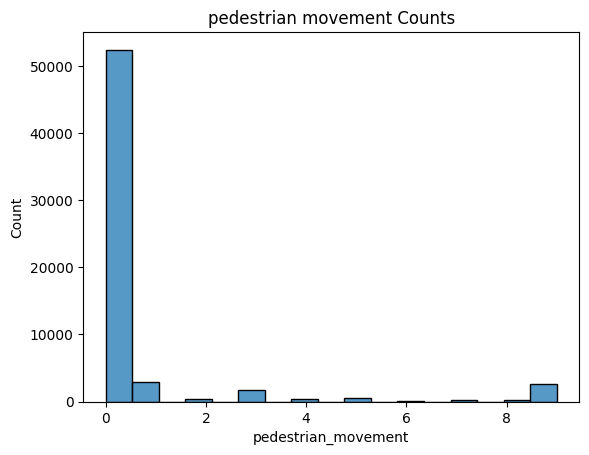

Unique values of pedestrian_movement


	'0' repeated 52411
	'2' repeated 429
	'9' repeated 2567
	'8' repeated 224
	'3' repeated 1784
	'1' repeated 2847
	'7' repeated 226
	'5' repeated 482
	'4' repeated 322
	'6' repeated 60




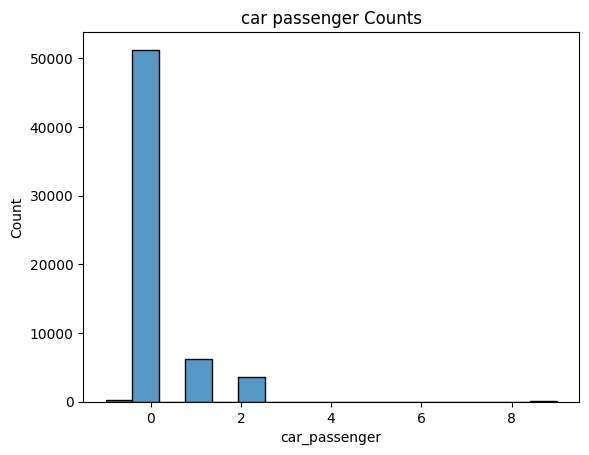

Unique values of car_passenger


	'0' repeated 51219
	'2' repeated 3582
	'1' repeated 6170
	'-1' repeated 314
	'9' repeated 67




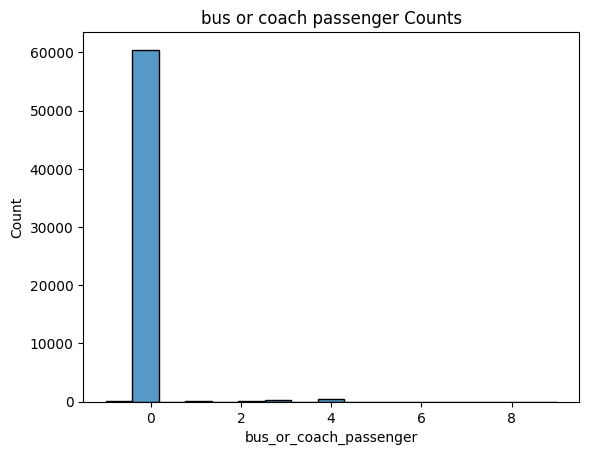

Unique values of bus_or_coach_passenger


	'0' repeated 60471
	'2' repeated 59
	'4' repeated 494
	'1' repeated 32
	'3' repeated 264
	'-1' repeated 23
	'9' repeated 9




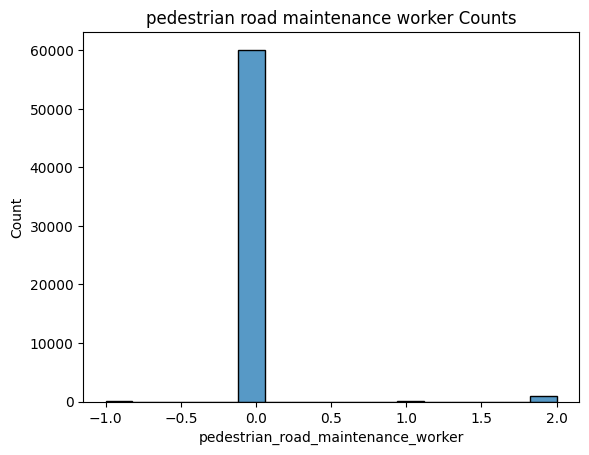

Unique values of pedestrian_road_maintenance_worker


	'0' repeated 60117
	'2' repeated 1007
	'1' repeated 115
	'-1' repeated 113




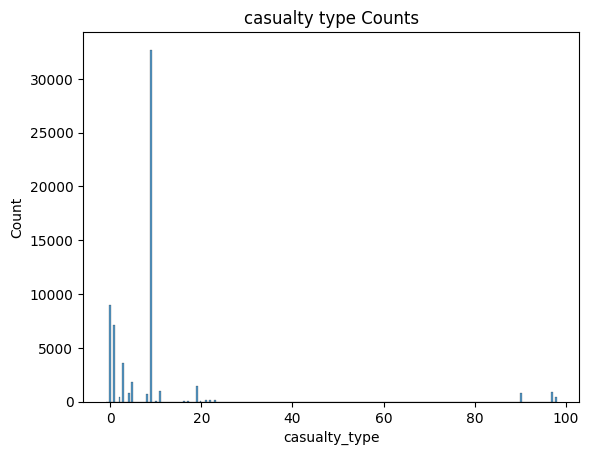

Unique values of casualty_type


	'9' repeated 32715
	'1' repeated 7155
	'0' repeated 8940
	'20' repeated 76
	'2' repeated 410
	'3' repeated 3629
	'17' repeated 31
	'5' repeated 1791
	'4' repeated 822
	'11' repeated 972
	'98' repeated 420
	'97' repeated 861
	'90' repeated 829
	'8' repeated 699
	'19' repeated 1448
	'21' repeated 178
	'23' repeated 127
	'22' repeated 110
	'10' repeated 96
	'16' repeated 34
	'18' repeated 4
	'-1' repeated 5




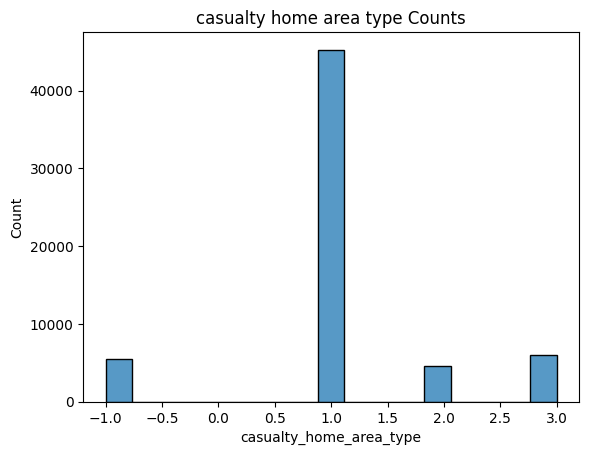

Unique values of casualty_home_area_type


	'1' repeated 45274
	'2' repeated 4579
	'3' repeated 6001
	'-1' repeated 5498




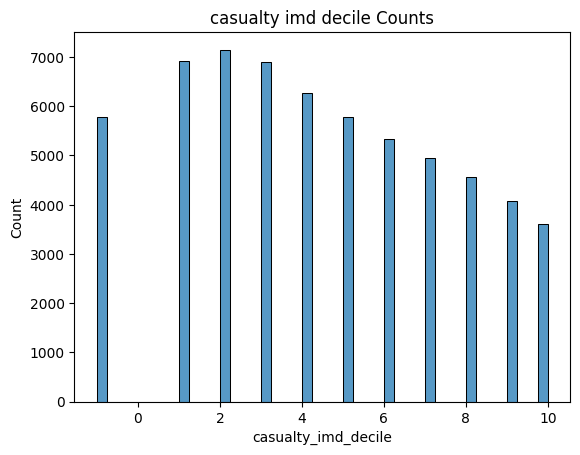

Unique values of casualty_imd_decile


	'9' repeated 4078
	'2' repeated 7152
	'10' repeated 3612
	'7' repeated 4949
	'-1' repeated 5784
	'5' repeated 5791
	'8' repeated 4562
	'3' repeated 6903
	'4' repeated 6268
	'1' repeated 6922
	'6' repeated 5331




In [ ]:
# bar plot of some features of the dataset
columns = ['casualty_reference',
 'casualty_class',
 'sex_of_casualty',
 'age_of_casualty',
 'age_band_of_casualty',
 'casualty_severity',
 'pedestrian_location',
 'pedestrian_movement',
 'car_passenger',
 'bus_or_coach_passenger',
 'pedestrian_road_maintenance_worker',
 'casualty_type',
 'casualty_home_area_type',
 'casualty_imd_decile']

for column in columns:
    plt.figure()
    sns.histplot(data[column])
    plt.title(f"{column.replace('_', ' ')} Counts")
    plt.xlabel(f"{column}")
    plt.ylabel("Count")
    plt.show()

    print(f"Unique values of {column}")

    print("\n")
    for unique_value in data[column].unique():
        print(f"\t'{unique_value}' repeated {len(data.loc[data[column] == unique_value])}")
    print("\n")

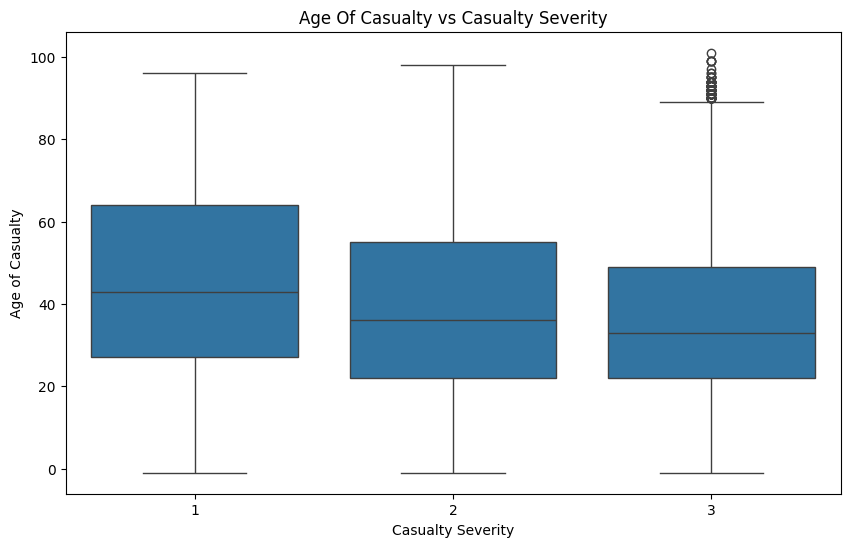

In [ ]:
# Let's analize the relationship between "casualty_severity" nad "age_of_casualty"
plt.figure(figsize=(10, 6))
sns.boxplot(x="casualty_severity", y="age_of_casualty", data=data)
plt.title("Age Of Casualty vs Casualty Severity")
plt.xlabel("Casualty Severity")
plt.ylabel("Age of Casualty")
plt.show()

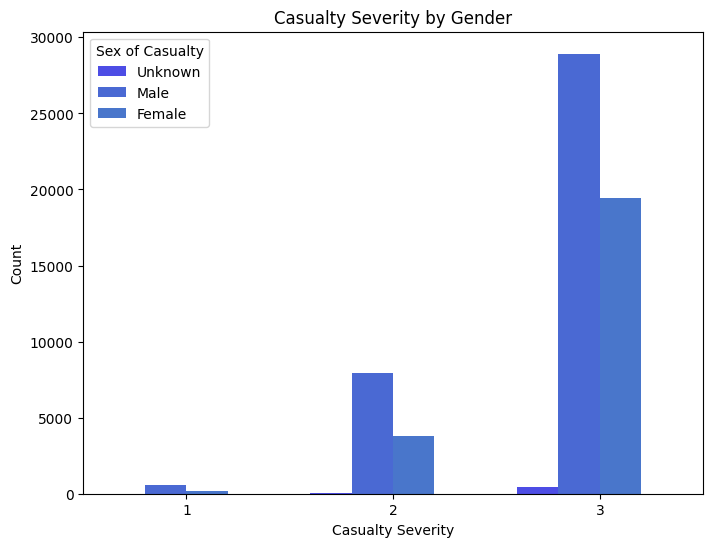

<Figure size 640x480 with 0 Axes>

In [25]:
# Plot the relationship between casualty severity and gender
plt.figure(figsize=(8, 6))
sns.countplot(x="casualty_severity", hue="sex_of_casualty", alpha=0.8, palette="winter", data=data)
plt.title("Casualty Severity by Gender")
plt.xlabel("Casualty Severity")
plt.ylabel("Count")
plt.legend(title="Sex of Casualty", labels=["Unknown", "Male", "Female"])
plt.show()

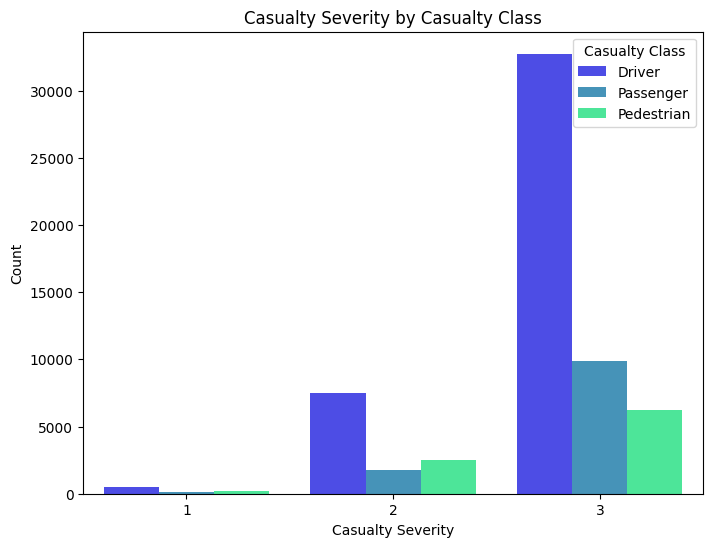

<Figure size 640x480 with 0 Axes>

In [27]:
# Plot the relationship between casualty severity and casualty class
plt.figure(figsize=(8, 6))
sns.countplot(x="casualty_severity", hue="casualty_class", alpha=0.8, palette="winter", data=data)
plt.title("Casualty Severity by Casualty Class")
plt.xlabel("Casualty Severity")
plt.ylabel("Count")
plt.legend(title="Casualty Class", labels=["Driver", "Passenger", "Pedestrian"])
plt.show()

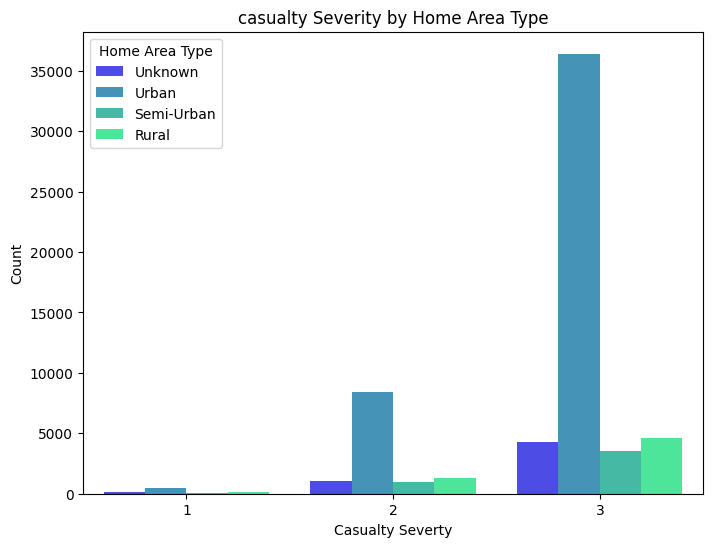

<Figure size 640x480 with 0 Axes>

In [28]:
# Plot the relationship between casualty severity and casualty's home area type
plt.figure(figsize=(8, 6))
sns.countplot(x="casualty_severity", hue="casualty_home_area_type", alpha=0.8, palette="winter", data=data)
plt.title("casualty Severity by Home Area Type")
plt.xlabel("Casualty Severty")
plt.ylabel("Count")
plt.legend(title="Home Area Type", labels=["Unknown", "Urban", "Semi-Urban", "Rural"])
plt.show()

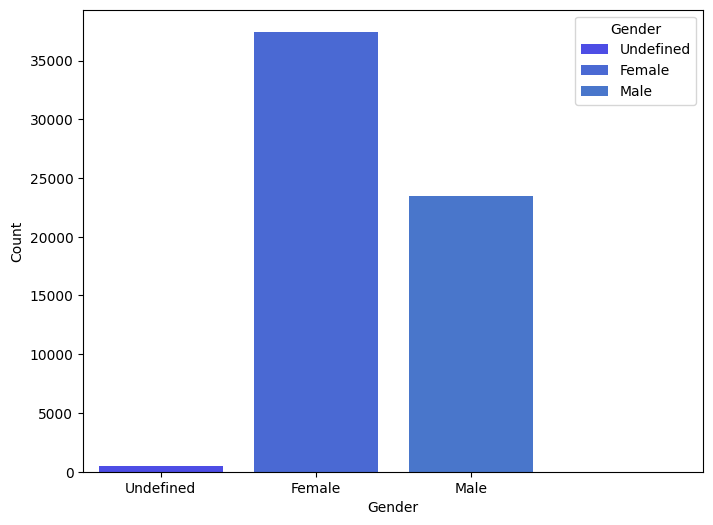

<Figure size 640x480 with 0 Axes>

In [29]:
# Plot the distribution of accident by gender
plt.figure(figsize=(8, 6))
sns.countplot(x="sex_of_casualty", hue="sex_of_casualty", alpha=0.8, palette="winter", data=data)
plt.xlabel("Gender")
plt.ylabel("Count")
plt.legend(title="Gender", labels=["Undefined", "Female", "Male"])
plt.xticks([0, 1, 2], ["Undefined", "Female", "Male"])
plt.show()

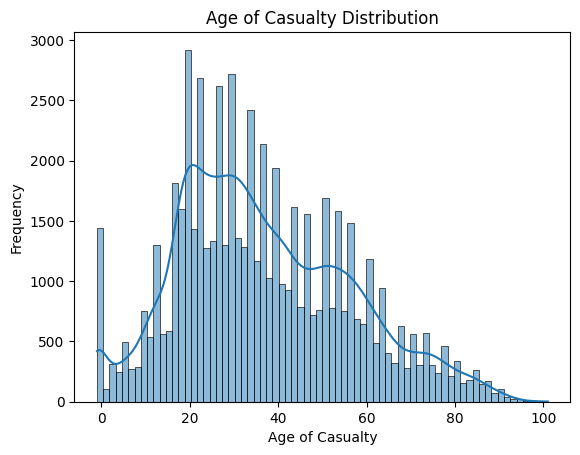

<Figure size 640x480 with 0 Axes>

In [30]:
# as we vidualized the age of casualty before, let's visualize the distribution of that again
sns.histplot(data["age_of_casualty"], kde=True)
plt.title("Age of Casualty Distribution")
plt.xlabel("Age of Casualty")
plt.ylabel("Frequency")
plt.show()

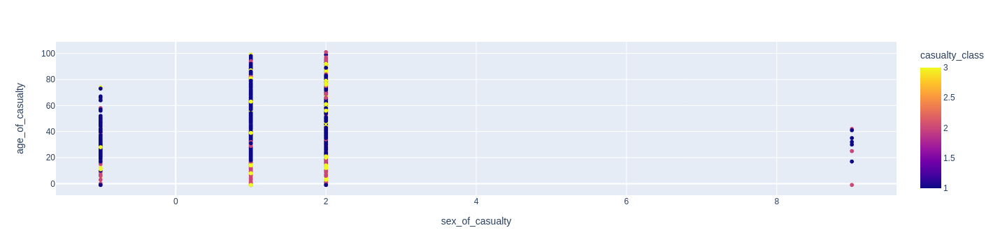

In [31]:
fig = px.scatter(data, x="sex_of_casualty", y="age_of_casualty", color="casualty_class")
fig.show()

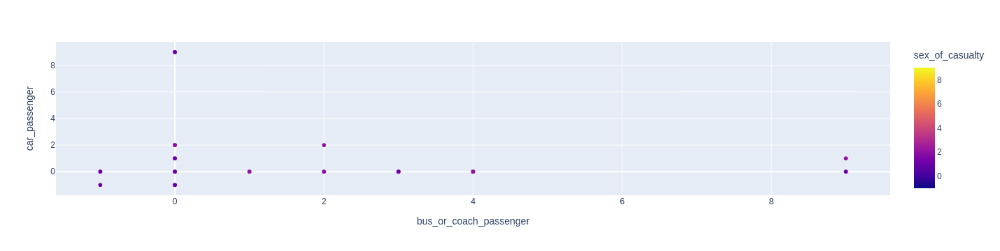

In [32]:
fig = px.scatter(data, x="bus_or_coach_passenger", y="car_passenger", color="sex_of_casualty")
fig.show()

## Clean the data

In [33]:
# Count the number of records with negative ages
negative_age_count = data[data['age_of_casualty'] < 0].shape[0]

# Count the number of records with undefined gender values
undefined_gender_count = data[(data['sex_of_casualty'] == -1) | (data['sex_of_casualty'] == 9)].shape[0]

print(f"negative age repeated : {negative_age_count}, undefined gender repeated : {undefined_gender_count}")

negative age repeated : 1350, undefined gender repeated : 458


In [34]:
# Exclude records with negative ages or undefined gender values
df_clean = data[(data['age_of_casualty'] >= 0) & ((data['sex_of_casualty'] == 1) | (data['sex_of_casualty'] == 2))]

# Verify that the records have been removed
negative_age_count_clean = df_clean[df_clean['age_of_casualty'] < 0].shape[0]
undefined_gender_count_clean = df_clean[(df_clean['sex_of_casualty'] == -1) | (df_clean['sex_of_casualty'] == 9)].shape[0]

print(f"shape of the cleaned dataset is : {df_clean.shape}")

shape of the cleaned dataset is : (59826, 18)


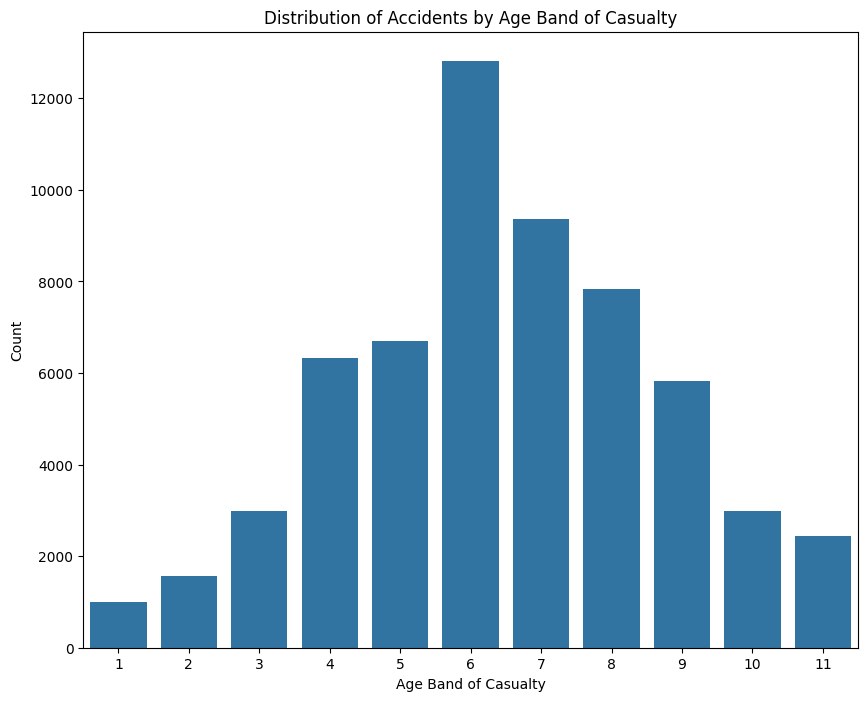

<Figure size 640x480 with 0 Axes>

In [35]:
# Plot the distribution of accidents across age bands
plt.figure(figsize=(10, 8))
sns.countplot(x='age_band_of_casualty', data=df_clean)
plt.title('Distribution of Accidents by Age Band of Casualty')
plt.xlabel('Age Band of Casualty')
plt.ylabel('Count')
plt.show()

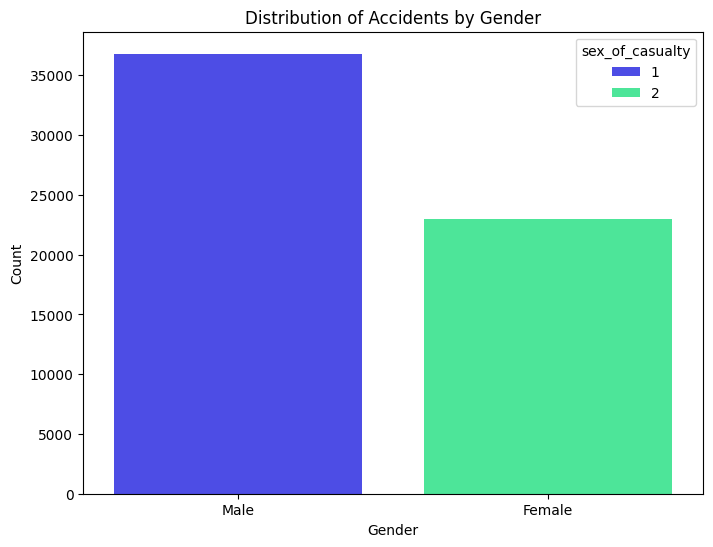

<Figure size 640x480 with 0 Axes>

In [36]:
# Plot the distribution of accidents by gender
plt.figure(figsize=(8, 6))
sns.countplot(x='sex_of_casualty', hue="sex_of_casualty", alpha=0.8, palette="winter", data=df_clean)
plt.title('Distribution of Accidents by Gender')
plt.xlabel('Gender')
plt.ylabel('Count')
plt.xticks([0, 1], ['Male', 'Female'])
plt.show()

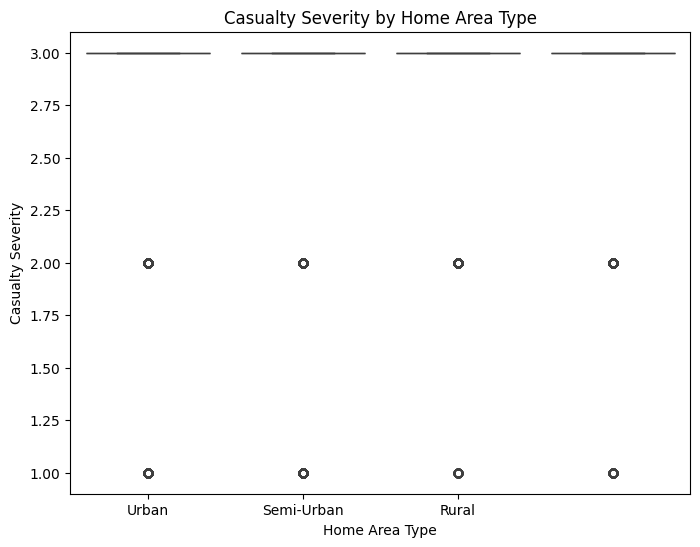

In [ ]:
# Plot the relationship between home area type and casualty severity
plt.figure(figsize=(8, 6))
sns.boxplot(x='casualty_home_area_type', y='casualty_severity', data=df_clean)
plt.title('Casualty Severity by Home Area Type')
plt.xlabel('Home Area Type')
plt.ylabel('Casualty Severity')
plt.xticks([0, 1, 2], ['Urban', 'Semi-Urban', 'Rural'])
plt.show()

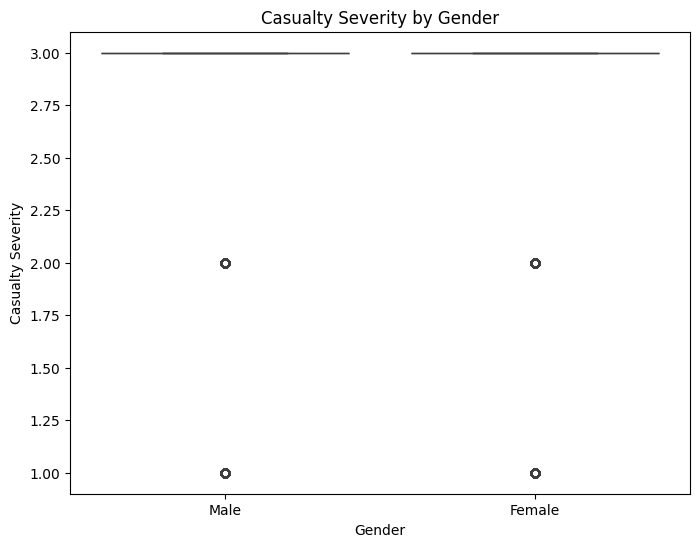

In [ ]:
# Plot the relationship between gender and casualty severity
plt.figure(figsize=(8, 6))
sns.boxplot(x='sex_of_casualty', y='casualty_severity', data=df_clean)
plt.title('Casualty Severity by Gender')
plt.xlabel('Gender')
plt.ylabel('Casualty Severity')
plt.xticks([0, 1], ['Male', 'Female'])
plt.show()

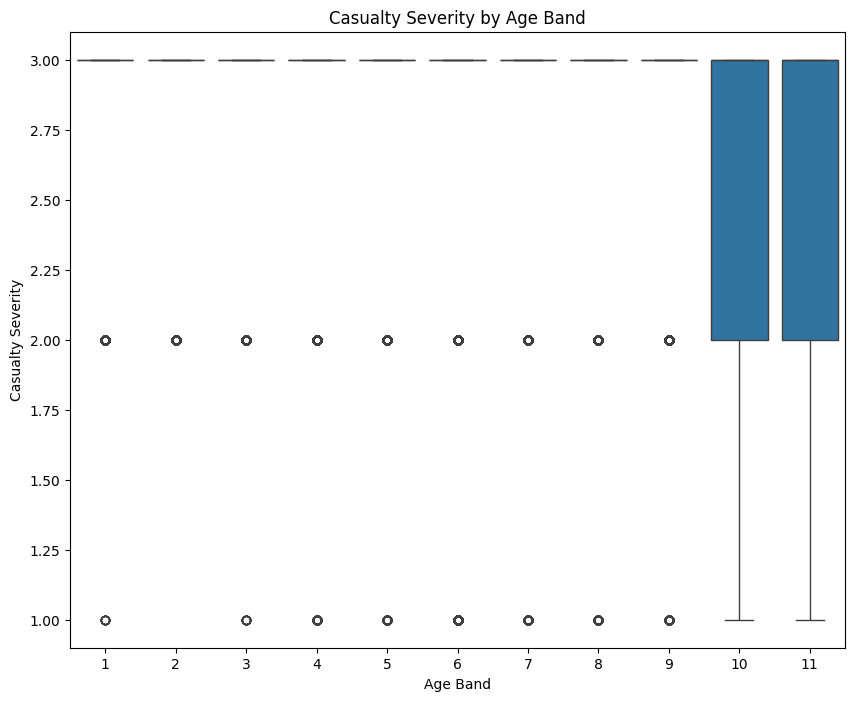

In [ ]:
# Plot the relationship between age band and casualty severity
plt.figure(figsize=(10, 8))
sns.boxplot(x='age_band_of_casualty', y='casualty_severity', data=df_clean)
plt.title('Casualty Severity by Age Band')
plt.xlabel('Age Band')
plt.ylabel('Casualty Severity')
plt.show()

## Machine Learning

after we did some analysis and data cleaning, now it's time to do some machine learning stuff to predict the read accident severity
we use to machine learning algorithms, Logistic Regression and Decision Tree to do our process and predictions

### Feature Engineering

In [38]:
# Selecting relevant features for the model. This can be changed according to the problem at hand.
features = ['vehicle_reference', 'casualty_reference', 'casualty_class', 'sex_of_casualty', 'age_of_casualty', 'age_band_of_casualty', 'casualty_severity', 'pedestrian_location', 'pedestrian_movement', 'car_passenger', 'bus_or_coach_passenger', 'pedestrian_road_maintenance_worker', 'casualty_type', 'casualty_home_area_type', 'casualty_imd_decile']
data = data[features]

In [39]:
# Feature Transformation

df = data[features].copy()

In [40]:
# Label Encoding for categorical variables

le = LabelEncoder()
categorical_features = ['casualty_class', 'sex_of_casualty', 'car_passenger', 'bus_or_coach_passenger', 'pedestrian_road_maintenance_worker', 'casualty_type', 'casualty_home_area_type']

for feature in categorical_features:
    df[feature] = le.fit_transform(df[feature])

# Standard Scaling for numerical variables
scaler = StandardScaler()
numerical_features = ['vehicle_reference', 'casualty_reference', 'age_of_casualty', 'age_band_of_casualty', 'pedestrian_location', 'pedestrian_movement', 'casualty_imd_decile']

for feature in numerical_features:
    df[feature] = scaler.fit_transform(df[feature].values.reshape(-1, 1))

df.head()

,vehicle_reference,casualty_reference,casualty_class,sex_of_casualty,age_of_casualty,age_band_of_casualty,casualty_severity,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker,casualty_type,casualty_home_area_type,casualty_imd_decile
0,0.495232,-0.340070,0,2,0.476632,0.695006,3,-0.364252,-0.321122,1,1,1,8,1,1.476134
1,-0.405793,-0.340070,0,1,-0.340771,-0.116991,3,-0.364252,-0.321122,1,1,1,8,1,-0.740129
2,-0.405793,-0.340070,0,2,1.089684,1.101005,3,-0.364252,-0.321122,1,1,1,8,1,1.792743
3,0.495232,1.697629,0,2,2.111437,1.913002,3,-0.364252,-0.321122,1,1,1,8,2,1.792743
4,1.396258,0.678779,0,1,1.345122,1.101005,3,-0.364252,-0.321122,1,1,1,8,3,0.842916


### Building our Logistic Regression Model

In [41]:
# Define our features

X = df.drop('casualty_severity', axis=1)
y = df['casualty_severity']

In [42]:
# Scaling our features

scaler = StandardScaler()
X = scaler.fit_transform(X)

In [43]:
# split our dataset into train and test sets

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [44]:
logistic_regression_model = LogisticRegression(max_iter=1000)

In [45]:
# it's time to train our model

logistic_regression_model.fit(X_train, y_train)

LogisticRegression(max_iter=1000)

### Logistic Regression Model Evaluate

In [46]:
y_pred_logistic = logistic_regression_model.predict(X_test)

In [47]:
# Accuracy
accuracy = accuracy_score(y_test, y_pred_logistic)
print(f'Accuracy: {accuracy}')

# Precision
precision = precision_score(y_test, y_pred_logistic, average='weighted')
print(f'Precision: {precision}')

# Recall
recall = recall_score(y_test, y_pred_logistic, average='weighted')
print(f'Recall: {recall}')

# F1 Score
f1 = f1_score(y_test, y_pred_logistic, average='weighted')
print(f'F1 Score: {f1}')

Accuracy: 0.7978974818678184
Precision: 0.6367573058231196
Recall: 0.7978974818678184
F1 Score: 0.7082777755824203


/home/amin/venv/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



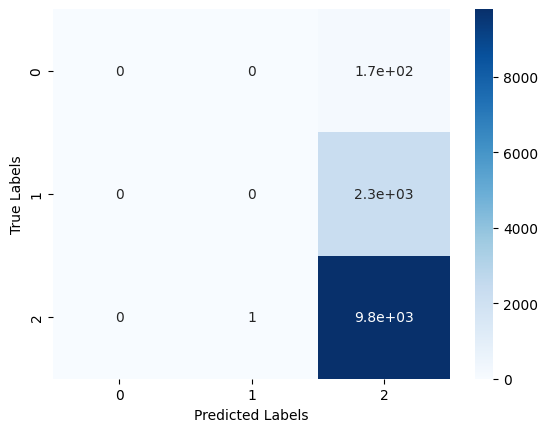

In [50]:
# Create the confusion matrix

confusion_matrix = confusion_matrix(y_test, y_pred_logistic)

# Plot the confusion matrix using a heatmap
sns.heatmap(confusion_matrix, annot=True, cmap='Blues')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

### Perform cross-validation

In [ ]:
# 10-fold Cross Validation
cv_scores = cross_val_score(logistic_regression_model, X, y, cv=10)

print(f'Cross Validation Scores: {cv_scores}')
print(f'Average CV Score: {cv_scores.mean()}')

Cross Validation Scores: [0.79612125 0.79563233 0.79608802 0.79592502 0.79592502 0.79576202
 0.79592502 0.79592502 0.79592502 0.79592502]
Average CV Score: 0.7959153748396838


### Neural Network Model

In [ ]:
categorical_y = tf.keras.utils.to_categorical(y - 1)

In [ ]:
# split our dataset into train and test sets

X_train, X_test, y_train, y_test = train_test_split(X, categorical_y, test_size=0.2, random_state=42)

In [ ]:
# Build our neural network model with tensorflow

model = keras.Sequential([
    keras.layers.Dense(5, activation='relu', input_shape=(14,)),
    keras.layers.Dense(20, activation='relu'),
    keras.layers.Dense(64, activation='relu'),
    keras.layers.Dense(128, activation='relu'),
    keras.layers.Dense(256, activation='relu'),
    keras.layers.Dense(128, activation='relu'),
    keras.layers.Dense(20, activation='relu'),
    keras.layers.Dense(3, activation='softmax')
])

# Now it's time for compile our nn model

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
history = model.fit(X_train, y_train, epochs=200, batch_size=32, validation_split=0.3, shuffle=True)

Epoch 1/200
1074/1074 [==============================] - 17s 12ms/step - loss: 0.5597 - accuracy: 0.7947 - val_loss: 0.5468 - val_accuracy: 0.7954
Epoch 2/200
1074/1074 [==============================] - 13s 13ms/step - loss: 0.5425 - accuracy: 0.7954 - val_loss: 0.5390 - val_accuracy: 0.7954
Epoch 3/200
1074/1074 [==============================] - 13s 12ms/step - loss: 0.5381 - accuracy: 0.7954 - val_loss: 0.5288 - val_accuracy: 0.7954
Epoch 4/200
1074/1074 [==============================] - 8s 8ms/step - loss: 0.5350 - accuracy: 0.7953 - val_loss: 0.5288 - val_accuracy: 0.7954
Epoch 5/200
1074/1074 [==============================] - 6s 5ms/step - loss: 0.5330 - accuracy: 0.7954 - val_loss: 0.5248 - val_accuracy: 0.7954
Epoch 6/200
1074/1074 [==============================] - 7s 7ms/step - loss: 0.5296 - accuracy: 0.7954 - val_loss: 0.5247 - val_accuracy: 0.7954
Epoch 7/200
1074/1074 [==============================] - 5s 5ms/step - loss: 0.5280 - accuracy: 0.7954 - val_loss: 0.5247 - 

In [ ]:
# Final evaluation of the model:
scores = model.evaluate(X_test, y_test - 1, verbose=1)
print(f'Test accuracy: {scores[1]}')

384/384 [==============================] - 1s 2ms/step - loss: -8.7435 - accuracy: 0.7930
Test accuracy: 0.7930079102516174


In [ ]:
def plot_loss(history):
    plt.style.use("ggplot")
    plt.figure(figsize=(8, 4))
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title("Model's training loss")
    plt.xlabel("Epoch #")
    plt.ylabel("Loss")
    plt.legend(['Train', 'Test'], loc='upper left')
    plt.show()


def plot_accuracy(history):
    plt.style.use("ggplot")
    plt.figure(figsize=(8, 4))
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])
    plt.title("Model's training accuracy")
    plt.xlabel("Epoch #")
    plt.ylabel("Accuracy")
    plt.legend(['Train', 'Test'], loc='upper left')
    plt.show()

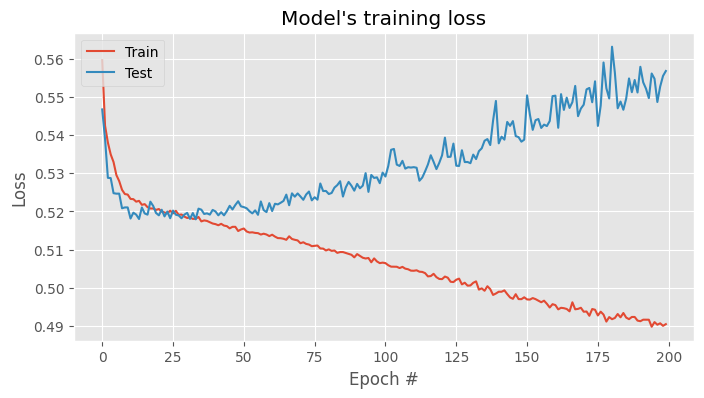

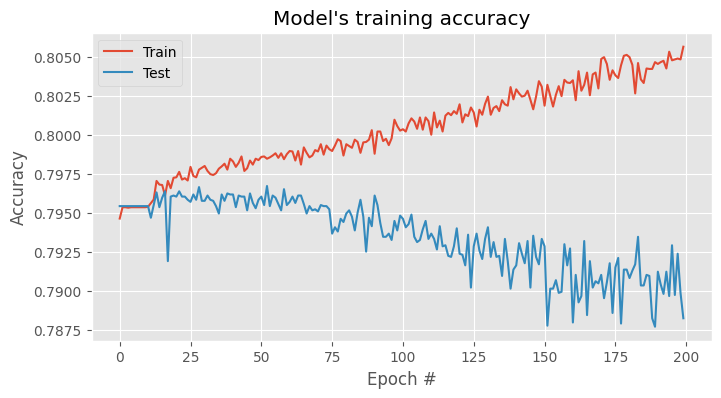

In [ ]:
# Let's take a look at our model perfomance

plot_loss(history)
plot_accuracy(history)

384/384 [==============================] - 2s 6ms/step


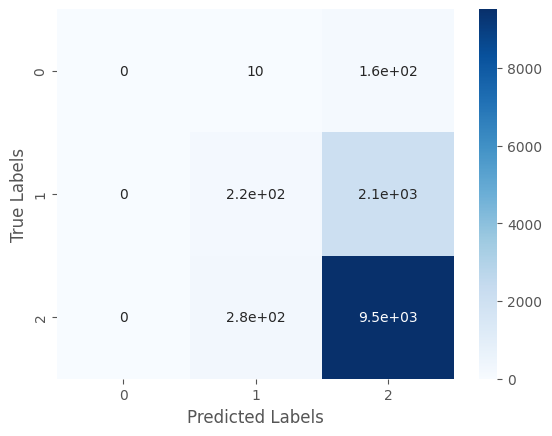

In [ ]:
y_pred = model.predict(X_test)

y_test_real = []
y_pred_real = []

for i in range(len(y_test)):
  y_test_real.append(np.argmax(y_test[i]))
  y_pred_real.append(np.argmax(y_pred[i]))

# Create the confusion matrix
confusion_matrix = tf.math.confusion_matrix(y_test_real, y_pred_real)

# Plot the confusion matrix using a heatmap
sns.heatmap(confusion_matrix, annot=True, cmap='Blues')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

In [ ]:
NN_Confusion_Matrix_table = PrettyTable(['metrices', 'values'])

# To insert rows:
NN_Confusion_Matrix_table.add_row(['Precision', sklearn.metrics.precision_score(y_test_real, y_pred_real, average='weighted')])
NN_Confusion_Matrix_table.add_row(['Recall', sklearn.metrics.recall_score(y_test_real, y_pred_real, average='weighted')])
NN_Confusion_Matrix_table.add_row(['f1_score', sklearn.metrics.f1_score(y_test_real, y_pred_real, average='weighted')])

print(NN_Confusion_Matrix_table)

+-----------+--------------------+
|  metrices |       values       |
+-----------+--------------------+
| Precision | 0.7266392330136313 |
|   Recall  | 0.7930079048162334 |
|  f1_score | 0.7338754719645181 |
+-----------+--------------------+


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

